# Impor Library

In [1]:
import os
import random
import shutil
import pathlib
import glob
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
import cv2
import gdown
import absl.logging
import logging

!pip install opendatasets
import opendatasets as od

warnings.filterwarnings('ignore')

!pip install tensorflowjs
import tensorflow as tf
import tensorflowjs as tfjs
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import (
    Conv2D, MaxPooling2D, Flatten, Dropout, Dense,
    GlobalAveragePooling2D, BatchNormalization
)

from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetV2B0, MobileNetV2
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input

from tensorflow.keras.preprocessing.image import load_img, img_to_array

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 5.6 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-cloud-bigquery 3.33.0 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
db-dtypes 1.4.3 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.


# Data Preparation

Download Dataset melalui Google Drive

[Kaggle](https://www.kaggle.com/datasets/arghianfaizalyusup/dataset-penyakit-kulit)

#Load Dataset

In [2]:
od.download(
    "https://www.kaggle.com/datasets/arghianfaizalyusup/dataset-penyakit-kulit")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: hentaligagaga
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/arghianfaizalyusup/dataset-penyakit-kulit


100%|██████████| 304M/304M [00:06<00:00, 49.8MB/s]

In [3]:
dataset_path = '/content/dataset-penyakit-kulit/Dataset'
os.listdir(dataset_path)

['Cellulitis Impetigo',
 'Shingles',
 'Seborrheic Keratoses',
 'Acne and Rosacea',
 'Normal',
 'Atopic Dermatitis',
 'Herpes HPV',
 'Systemic Disease',
 'Lupus',
 'Chickenpox',
 'Urticaria Hives',
 'Warts Molluscum and other Viral Infections',
 'Athlete Foot',
 'Vasculitis',
 'Vascular Tumors',
 'Cutaneous Larva Migrans',
 'Psoriasis pictures Lichen Planus',
 'Actinic Keratosis Basal Cell Carcinoma',
 'Nail Fungus',
 'Poison Ivy and Contact Dermatitis',
 'Ringworm',
 'Tinea Ringworm Candidiasis',
 'Eczema',
 'Exanthems',
 'Disorders of Pigmentation',
 'Melanoma Skin Cancer Nevi']

# Data Understanding

##Cek Keberagaman pada Dataset

In [4]:
def count_images_and_resolution(base_path, target_resolution=None):
    class_count = {}
    resolution_count = {}

    for root, dirs, files in os.walk(base_path):
        if root == base_path:
            continue  # Lewati folder utama

        class_name = os.path.basename(root)
        class_count[class_name] = 0

        for file in files:
            if not file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                continue  # Lewati jika bukan file gambar

            file_path = os.path.join(root, file)
            with Image.open(file_path) as img:
                width, height = img.size
                resolution = f"{width}x{height}"

                class_count[class_name] += 1

                if resolution not in resolution_count:
                    resolution_count[resolution] = 0
                resolution_count[resolution] += 1

                if target_resolution and resolution == target_resolution:
                    if 'target' not in resolution_count:
                        resolution_count['target'] = 0
                    resolution_count['target'] += 1

    return class_count, resolution_count

# Contoh penggunaan
base_path = "/content/dataset-penyakit-kulit/Dataset"
target_resolution = "256x256"

class_count, resolution_count = count_images_and_resolution(base_path, target_resolution)

print("Jumlah gambar per kelas:")
for class_name, count in class_count.items():
    print(f"{class_name}: {count}")

print("\nJumlah gambar per resolusi:")
for resolution, count in resolution_count.items():
    print(f"{resolution}: {count}")


Jumlah gambar per kelas:
Cellulitis Impetigo: 212
Shingles: 163
Seborrheic Keratoses: 111
Acne and Rosacea: 873
Normal: 129
Atopic Dermatitis: 124
Herpes HPV: 46
Systemic Disease: 108
Lupus: 115
Chickenpox: 170
Urticaria Hives: 5
Warts Molluscum and other Viral Infections: 299
Athlete Foot: 124
Vasculitis: 16
Vascular Tumors: 138
Cutaneous Larva Migrans: 125
Psoriasis pictures Lichen Planus: 86
Actinic Keratosis Basal Cell Carcinoma: 442
Nail Fungus: 162
Poison Ivy and Contact Dermatitis: 75
Ringworm: 113
Tinea Ringworm Candidiasis: 164
Eczema: 37
Exanthems: 26
Disorders of Pigmentation: 329
Melanoma Skin Cancer Nevi: 29

Jumlah gambar per resolusi:
224x224: 422
242x242: 6
720x480: 394
490x720: 16
253x253: 8
720x468: 23
214x214: 6
720x472: 769
493x720: 9
720x522: 2
212x212: 8
264x264: 7
720x512: 1
484x720: 36
234x234: 2
203x203: 11
259x259: 1
720x589: 3
466x720: 9
223x223: 6
213x213: 7
240x240: 7
480x720: 105
720x678: 2
590x720: 6
495x720: 9
477x720: 20
250x250: 3
196x196: 3
720x597: 2

## Cek Daftar Label pada Dataset

In [5]:
image_data='/content/dataset-penyakit-kulit/Dataset'
pd.DataFrame(os.listdir(image_data),columns=['Files_Name'])

,Files_Name
0,Cellulitis Impetigo
1,Shingles
2,Seborrheic Keratoses
3,Acne and Rosacea
4,Normal
5,Atopic Dermatitis
6,Herpes HPV
7,Systemic Disease
8,Lupus
9,Chickenpox


In [6]:
files = [i for i in glob.glob(image_data + "//*//*")]
np.random.shuffle(files)
labels = [os.path.dirname(i).split("/")[-1] for i in files]
data = zip(files, labels)
dataframe = pd.DataFrame(data, columns = ["Image", "Label"])
dataframe

,Image,Label
0,/content/dataset-penyakit-kulit/Dataset/Chicke...,Chickenpox
1,/content/dataset-penyakit-kulit/Dataset/Acne a...,Acne and Rosacea
2,/content/dataset-penyakit-kulit/Dataset/Disord...,Disorders of Pigmentation
3,/content/dataset-penyakit-kulit/Dataset/Acne a...,Acne and Rosacea
4,/content/dataset-penyakit-kulit/Dataset/Psoria...,Psoriasis pictures Lichen Planus
...,...,...
4217,/content/dataset-penyakit-kulit/Dataset/Disord...,Disorders of Pigmentation
4218,/content/dataset-penyakit-kulit/Dataset/Poison...,Poison Ivy and Contact Dermatitis
4219,/content/dataset-penyakit-kulit/Dataset/Athlet...,Athlete Foot
4220,/content/dataset-penyakit-kulit/Dataset/Lupus/...,Lupus


#Exploratory Data Analysis

##Daftar Gambar per Kelas

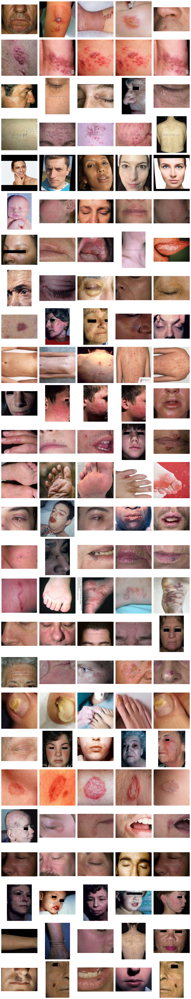

In [7]:
lung_image = {}

# Path dataset gabungan
path_sub = "/content/dataset-penyakit-kulit/Dataset"

# Ambil daftar file gambar per kelas di folder combined
for category in os.listdir(path_sub):
    class_path = os.path.join(path_sub, category)
    if os.path.isdir(class_path):
        lung_image[category] = os.listdir(class_path)

# Plot 5 gambar random per kelas
fig, axs = plt.subplots(len(lung_image), 5, figsize=(15, 3 * len(lung_image)))

for i, class_name in enumerate(lung_image):
    images = lung_image[class_name]
    sample_images = np.random.choice(images, min(len(images), 5), replace=False)

    for j in range(5):
        axs[i, j].axis('off')
        if j < len(sample_images):
            img_path = os.path.join(path_sub, class_name, sample_images[j])
            img = Image.open(img_path).convert("RGB")
            axs[i, j].imshow(img)
        if j == 0:
            axs[i, j].set_ylabel(class_name, size='large')

plt.tight_layout()
plt.show()

## Distribusi Label

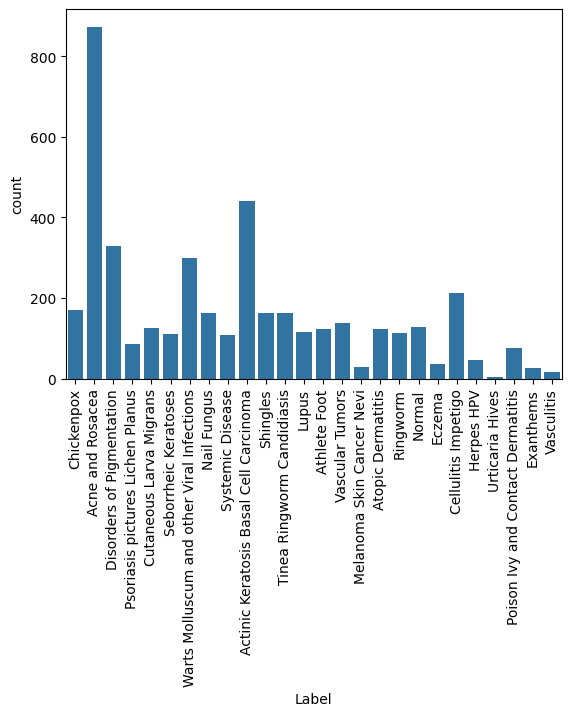

In [8]:
sns.countplot(x = dataframe["Label"])
plt.xticks(rotation = 90);

# Data Preprocessing

##Split Train, Validation, and Test

In [9]:
# Bikin folder baru buat split ulang
split_base = 'dataset_split'
for split in ['train', 'val', 'test']:
    for class_name in os.listdir(path_sub):
        os.makedirs(os.path.join(split_base, split, class_name), exist_ok=True)

# Parameter split
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

# Split dan salin file
for class_name in os.listdir(path_sub):
    class_dir = os.path.join(path_sub, class_name)

    if not os.path.isdir(class_dir):
        continue

    images = os.listdir(class_dir)
    random.shuffle(images)

    total = len(images)
    train_end = int(train_ratio * total)
    val_end = train_end + int(val_ratio * total)

    train_imgs = images[:train_end]
    val_imgs = images[train_end:val_end]
    test_imgs = images[val_end:]

    for img in train_imgs:
        shutil.copy2(os.path.join(class_dir, img), os.path.join(split_base, 'train', class_name, img))
    for img in val_imgs:
        shutil.copy2(os.path.join(class_dir, img), os.path.join(split_base, 'val', class_name, img))
    for img in test_imgs:
        shutil.copy2(os.path.join(class_dir, img), os.path.join(split_base, 'test', class_name, img))

print("Dataset successfully re-split into train, val, and test.")

Dataset successfully re-split into train, val, and test.


##Augmentasi Data

In [10]:
'''# ImageDataGenerator untuk augmentasi dan normalisasi
datagen = ImageDataGenerator(
    rescale=1./255,      # Normalisasi
    rotation_range=20,    # Rotasi gambar
    width_shift_range=0.2, # Pergeseran horizontal
    height_shift_range=0.2,# Pergeseran vertikal
    shear_range=0.2,      # Distorsi
    zoom_range=0.2,       # Zoom
    horizontal_flip=True, # Flip horizontal
    validation_split=0.2  # Data validasi
)

dataset_folder = '/content/dataset_split/train'

# Loop semua kelas (subfolder)
for class_name in os.listdir(dataset_folder):
    class_path = os.path.join(dataset_folder, class_name)

    if not os.path.isdir(class_path):
        continue  # Skip kalau bukan folder

    # Loop semua gambar dalam subfolder
    for img_name in os.listdir(class_path):
        img_path = os.path.join(class_path, img_name)

        try:
            # Load gambar
            img = load_img(img_path)
            x = img_to_array(img)
            x = np.expand_dims(x, axis=0)

            # Generate 1 augmentasi per gambar
            i = 0
            for batch in datagen.flow(
                x,
                batch_size=1,
                save_to_dir=class_path,         # <-- simpan ke folder asli
                save_prefix='aug',              # <-- prefix nama file baru
                save_format='jpg'                # <-- format gambar
            ):
                i += 1
                if i >= 1:  # <-- jumlah augmentasi per gambar
                    break
        except Exception as e:
            print(f"Error processing {img_path}: {e}")'''

'# ImageDataGenerator untuk augmentasi dan normalisasi\ndatagen = ImageDataGenerator(\n    rescale=1./255,      # Normalisasi\n    rotation_range=20,    # Rotasi gambar\n    width_shift_range=0.2, # Pergeseran horizontal\n    height_shift_range=0.2,# Pergeseran vertikal\n    shear_range=0.2,      # Distorsi\n    zoom_range=0.2,       # Zoom\n    horizontal_flip=True, # Flip horizontal\n    validation_split=0.2  # Data validasi\n)\n\ndataset_folder = \'/content/dataset_split/train\'\n\n# Loop semua kelas (subfolder)\nfor class_name in os.listdir(dataset_folder):\n    class_path = os.path.join(dataset_folder, class_name)\n\n    if not os.path.isdir(class_path):\n        continue  # Skip kalau bukan folder\n\n    # Loop semua gambar dalam subfolder\n    for img_name in os.listdir(class_path):\n        img_path = os.path.join(class_path, img_name)\n\n        try:\n            # Load gambar\n            img = load_img(img_path)\n            x = img_to_array(img)\n            x = np.expand_d

In [11]:
# Calculate the average number of images per class
total_images = sum(class_count.values())
average_count = total_images / len(class_count)

# Or define a target count
target_count = average_count # Or a higher value

# Loop through each class in the training dataset
dataset_folder = '/content/dataset_split/train'

for class_name in os.listdir(dataset_folder):
    class_path = os.path.join(dataset_folder, class_name)

    if not os.path.isdir(class_path):
        continue

    # Get the number of images in the current class
    current_class_image_count = len(os.listdir(class_path)) # Or use class_count[class_name] if pre-calculated

    # Check if the current class is underrepresented
    if current_class_image_count < target_count:
        # Calculate how many more augmented images are needed
        images_to_generate = target_count - current_class_image_count

        # Determine how many augmented images to generate per original image
        if current_class_image_count > 0:
             augmentations_per_image = max(1, int(images_to_generate / current_class_image_count))
        else:
             augmentations_per_image = target_count # If a class has 0 images, generate the target amount from a few seed images if available elsewhere, or skip.

        print(f"Class '{class_name}' is underrepresented. Generating {augmentations_per_image} augmented images per original image.")

        # Loop through each image in the underrepresented class
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)

            try:
                img = load_img(img_path)
                x = img_to_array(img)
                x = np.expand_dims(x, axis=0)

                # Generate the calculated number of augmented images
                i = 0
                for batch in datagen.flow(
                    x,
                    batch_size=1,
                    save_to_dir=class_path,
                    save_prefix='aug',
                    save_format='jpg'
                ):
                    i += 1
                    if i >= augmentations_per_image:
                        break
            except Exception as e:
                print(f"Error processing {img_path}: {e}")

    else:

        print(f"Class '{class_name}' is well-represented. Skipping extra augmentation.")

print("Data augmentation for underrepresented classes complete.")

Class 'Cellulitis Impetigo' is underrepresented. Generating 1 augmented images per original image.
Error processing /content/dataset_split/train/Cellulitis Impetigo/23_BA-impetigo (43).jpg: name 'datagen' is not defined
Error processing /content/dataset_split/train/Cellulitis Impetigo/94_BA-impetigo (6).jpg: name 'datagen' is not defined
Error processing /content/dataset_split/train/Cellulitis Impetigo/72_BA-impetigo (85).jpg: name 'datagen' is not defined
Error processing /content/dataset_split/train/Cellulitis Impetigo/Staphylococcal-Folliculitis-13.jpg: name 'datagen' is not defined
Error processing /content/dataset_split/train/Cellulitis Impetigo/68_BA-impetigo (86).jpg: name 'datagen' is not defined
Error processing /content/dataset_split/train/Cellulitis Impetigo/Furuncles-Carbuncles-27.jpg: name 'datagen' is not defined
Error processing /content/dataset_split/train/Cellulitis Impetigo/60_BA-impetigo (3).png: name 'datagen' is not defined
Error processing /content/dataset_split/t

##Load Train, Val, Test

In [12]:
base_dir = 'dataset_split'
batch_size = 32
target_size = (224, 224)

# Load train dataset
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    directory=os.path.join(base_dir, 'train'),
    label_mode='categorical',  # pakai categorical kalau multi-class
    image_size=target_size,
    batch_size=batch_size,
    shuffle=True,
    seed=123
)

# Load validation dataset
val_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    directory=os.path.join(base_dir, 'val'),
    label_mode='categorical',
    image_size=target_size,
    batch_size=batch_size,
    shuffle=False,
    seed=123
)

# Load test dataset
test_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    directory=os.path.join(base_dir, 'test'),
    label_mode='categorical',
    image_size=target_size,
    batch_size=batch_size,
    shuffle=False,
    seed=123
)

Found 2943 files belonging to 26 classes.
Found 618 files belonging to 26 classes.
Found 660 files belonging to 26 classes.


##Class Weights

In [13]:
def calculate_class_weights(y_labels, class_names):
    unique_classes, class_counts = np.unique(y_labels, return_counts=True)
    total_samples = len(y_labels)
    class_weights = {}

    # Create weights for all classes in class_names, even if not in train data
    for class_name in class_names:
        if class_name in unique_classes:  # If class is in train data
            class_index = np.where(unique_classes == class_name)[0][0]
            class_count = class_counts[class_index]
            weight = total_samples / (len(unique_classes) * class_count)
            class_weights[class_name] = round(weight, 2)
        else:  # If class is not in train data, give it a default weight (e.g., 1)
            class_weights[class_name] = 1.0

    return class_weights

# Extract labels from the train dataset
y_labels = []
for images, labels in train_dataset:  # Iterate through batches
    y_labels.extend(np.argmax(labels.numpy(), axis=1))  # Get class indices from one-hot encoded labels

# Get class names from the train dataset
class_names = train_dataset.class_names  # Access class names directly

# Calculate class weights using the updated function
raw_class_weights = calculate_class_weights(y_labels, class_names)  # Pass class_names to the function


# Create a dictionary mapping class indices to weights
indexed_class_weights = {i: raw_class_weights[class_name] for i, class_name in enumerate(class_names)}

print("Class weights (siap pakai untuk model):")
for idx, weight in indexed_class_weights.items():
    # Use the index to get the corresponding label
    label = class_names[idx]
    print(f"Index {idx} (Label '{label}'): {weight}")

Class weights (siap pakai untuk model):
Index 0 (Label 'Acne and Rosacea'): 1.0
Index 1 (Label 'Actinic Keratosis Basal Cell Carcinoma'): 1.0
Index 2 (Label 'Athlete Foot'): 1.0
Index 3 (Label 'Atopic Dermatitis'): 1.0
Index 4 (Label 'Cellulitis Impetigo'): 1.0
Index 5 (Label 'Chickenpox'): 1.0
Index 6 (Label 'Cutaneous Larva Migrans'): 1.0
Index 7 (Label 'Disorders of Pigmentation'): 1.0
Index 8 (Label 'Eczema'): 1.0
Index 9 (Label 'Exanthems'): 1.0
Index 10 (Label 'Herpes HPV'): 1.0
Index 11 (Label 'Lupus'): 1.0
Index 12 (Label 'Melanoma Skin Cancer Nevi'): 1.0
Index 13 (Label 'Nail Fungus'): 1.0
Index 14 (Label 'Normal'): 1.0
Index 15 (Label 'Poison Ivy and Contact Dermatitis'): 1.0
Index 16 (Label 'Psoriasis pictures Lichen Planus'): 1.0
Index 17 (Label 'Ringworm'): 1.0
Index 18 (Label 'Seborrheic Keratoses'): 1.0
Index 19 (Label 'Shingles'): 1.0
Index 20 (Label 'Systemic Disease'): 1.0
Index 21 (Label 'Tinea Ringworm Candidiasis'): 1.0
Index 22 (Label 'Urticaria Hives'): 1.0
Index

#Modeling

##Model Sequential, Conv2D, Pooling Layer

In [14]:
# Membangun arsitektur CNN
model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D(2,2),

    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),

    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D(2,2),

    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),  # Mengurangi overfitting
    Dense(len(train_dataset.class_names), activation='softmax')  # Output sesuai jumlah kelas
])

# Compile model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Menampilkan arsitektur model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    44,302,848 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 26)             │        13,338 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 44,409,434 (169.41 MB)

 Trainable params: 44,409,434 (169.41 MB)

 Non-trainable params: 0 (0.00 B)

In [15]:
# Latih model dengan dataset
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=10,
    class_weight=indexed_class_weights
)

Epoch 1/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - accuracy: 0.1386 - loss: 110.8071 - val_accuracy: 0.2233 - val_loss: 3.0561
Epoch 2/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2744 - loss: 2.7842 - val_accuracy: 0.2346 - val_loss: 3.0038
Epoch 3/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - accuracy: 0.3670 - loss: 2.3378 - val_accuracy: 0.2346 - val_loss: 3.1955
Epoch 4/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - accuracy: 0.3971 - loss: 2.1230 - val_accuracy: 0.2767 - val_loss: 3.7111
Epoch 5/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4988 - loss: 1.8053 - val_accuracy: 0.2880 - val_loss: 3.5141
Epoch 6/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - accuracy: 0.5701 - loss: 1.5339 - val_accuracy: 0.2799 - val_loss: 3.3490
Epoch 7/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - accuracy: 0.5966 - loss: 1.4424 - val_accuracy: 0.2670 - val_loss: 4.7652
Epoch 8/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.6570 - loss: 1.2591 - val_accuracy: 0.

#Evaluasi dan Visualisasi

##Evaluasi Model di Data Test

In [16]:
loss, accuracy = model.evaluate(test_dataset)
print(f"Test Accuracy: {accuracy:.4f}")
print(f"Test Loss: {loss:.4f}")

21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - accuracy: 0.5122 - loss: 3.3675
Test Accuracy: 0.3273
Test Loss: 4.7247


##Visualisasi Model

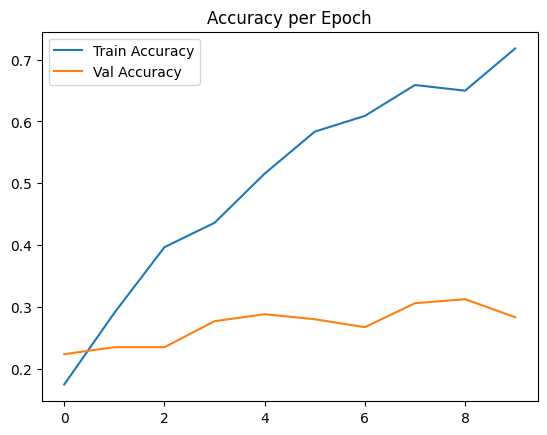

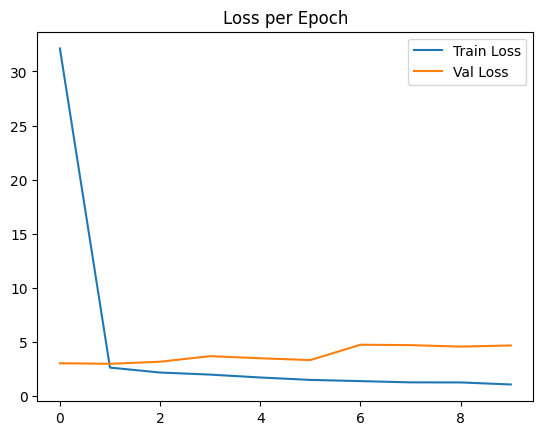

In [17]:
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Accuracy per Epoch')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss per Epoch')
plt.legend()
plt.show()

#Konversi Model

##Saved Model

In [18]:
model.export("saved_model/my_model")

Saved artifact at 'saved_model/my_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 26), dtype=tf.float32, name=None)
Captures:
  133414156999312: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133414157000848: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133414104684432: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133414104683088: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133414104685008: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133414104683664: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133414157000464: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133414104682320: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133414104685968: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133414104687504: TensorSpec(shape=(), dtype=tf.resource, name=None)


##TF-Lite

In [19]:
# 1. Konversi SavedModel ke TFLite
converter = tf.lite.TFLiteConverter.from_saved_model("saved_model/my_model")
tflite_model = converter.convert()

# 2. Buat folder simpan model TFLite
os.makedirs('tflite', exist_ok=True)

# 3. Simpan model .tflite
with open('tflite/model.tflite', 'wb') as f:
    f.write(tflite_model)

print("Model berhasil dikonversi ke TFLite dan disimpan sebagai 'tflite/model.tflite'")

# 4. Simpan file label
class_names = ['Cellulitis Impetigo',
               'Shingles',
               'Seborrheic Keratoses',
               'Acne and Rosacea',
               'Normal',
               'Atopic Dermatitis',
               'Herpes HPV',
               'Systemic Disease',
               'Lupus',
               'Chickenpox',
               'Urticaria Hives',
               'Warts Molluscum and other Viral Infections',
               'Athlete Foot',
               'Vasculitis',
               'Vascular Tumors',
               'Cutaneous Larva Migrans',
               'Psoriasis pictures Lichen Planus',
               'Actinic Keratosis Basal Cell Carcinoma',
               'Nail Fungus',
               'Poison Ivy and Contact Dermatitis',
               'Ringworm',
               'Tinea Ringworm Candidiasis',
               'Eczema',
               'Exanthems',
               'Disorders of Pigmentation',
               'Melanoma Skin Cancer Nevi'
]

with open('tflite/label.txt', 'w') as f:
    for name in class_names:
        f.write(name + '\n')

print("Label berhasil disimpan sebagai 'tflite/label.txt'")

Model berhasil dikonversi ke TFLite dan disimpan sebagai 'tflite/model.tflite'
Label berhasil disimpan sebagai 'tflite/label.txt'


##TFJS

In [20]:
!tensorflowjs_converter \
    --input_format=tf_saved_model \
    --output_format=tfjs_graph_model \
    --signature_name=serving_default \
    --saved_model_tags=serve \
    saved_model/my_model \
    tfjs_model

2025-06-03 08:53:58.080162: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748940838.099435    1921 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748940838.105270    1921 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
2025-06-03 08:54:02.030056: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0000 00:00:1748940842.030233    1921 gpu_device.cc:2022] Created device /job:localhost/replica:0/task

#Inference

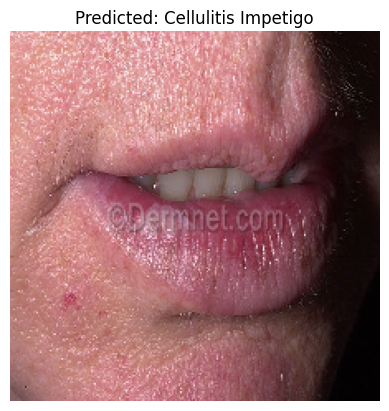

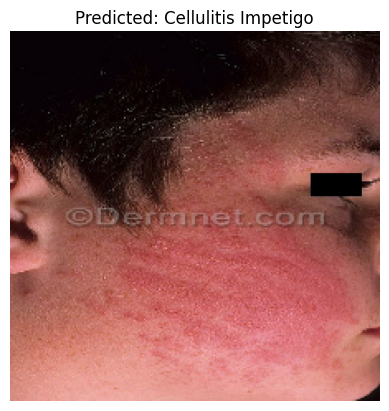

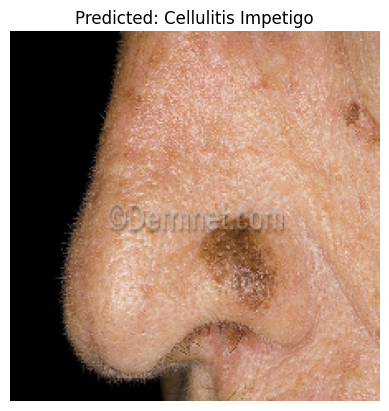

In [22]:
def predict_and_display(img_path, interpreter, class_names):
    # Load dan preprocess image
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    # Get input and output details
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    # Set input tensor and invoke the interpreter
    interpreter.set_tensor(input_details[0]['index'], img_array)
    interpreter.invoke()

    # Get the output tensor
    predictions = interpreter.get_tensor(output_details[0]['index'])

    # Get predicted class
    predicted_class = np.argmax(predictions, axis=1)
    predicted_label = class_names[predicted_class[0]]

    # Display the image and prediction
    plt.imshow(img)
    plt.title(f'Predicted: {predicted_label}')
    plt.axis('off')
    plt.show()

# Load interpreter
interpreter = tf.lite.Interpreter(model_path='tflite/model.tflite')
interpreter.allocate_tensors()

# Load image for test
Image_One = "/content/dataset_split/test/Actinic Keratosis Basal Cell Carcinoma/actinic-cheilitis-sq-cell-lip-189.jpg"
predict_and_display(Image_One, interpreter, class_names)

Image_Two = "/content/dataset_split/test/Urticaria Hives/dermagraphism-12.jpg"
predict_and_display(Image_Two, interpreter, class_names)

Image_Three = "/content/dataset_split/test/Melanoma Skin Cancer Nevi/lentigo-maligna-23.jpg"
predict_and_display(Image_Three, interpreter, class_names)

#Kesimpulan